In [1]:
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import normalize
from wordcloud import WordCloud
from sentence_transformers import SentenceTransformer
import umap.umap_ as umap
import plotly.express as px
import plotly.graph_objects as go
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk

nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)

True

In [2]:
class VideoAnalysisPipeline:
    def __init__(self, data_dir, model_name="all-MiniLM-L6-v2", stop_words=None):
        self.data_dir = data_dir
        self.model = SentenceTransformer(model_name)
        self.lemmatizer = WordNetLemmatizer()
        self.stop_words = stop_words if stop_words else set(stopwords.words("english"))
        self.df = self.load_and_preprocess()

    def postprocess_text(self, text):
        stop_words_extended = [
            "ooh", "oh", "ah", "yeah", "la", "na", "da", "hey", "whoa", "whoah", "mm", "uh", 
            "huh", "hmm", "yeah", "poland", "polish", "vs", "gon", "poppy", "re", "ve", "ll", "m", "s", "t", "d",
        ]
        text = text.lower()
        words = text.split()
        for word in stop_words_extended:
            words = [w for w in words if w != word]
        text = " ".join(words)
        text = re.sub(r"[^a-z\s]", "", text)
        text = text.replace("nickel", "money")
        words = [self.lemmatizer.lemmatize(word) for word in text.split() if word not in self.stop_words and len(word) > 1]
        return " ".join(words)

    def load_and_preprocess(self):
        all_data = []
        for country in os.listdir(self.data_dir):
            country_path = os.path.join(self.data_dir, country)
            if not os.path.isdir(country_path):
                continue
            for category_file in os.listdir(country_path):
                category_path = os.path.join(country_path, category_file)
                if not category_file.endswith(".json"):
                    continue
                with open(category_path, "r", encoding="utf-8") as f:
                    channels = json.load(f)
                for channel in channels:
                    videos = channel["videos"]
                    for video in videos:
                        video["country"] = country
                        video["category"] = os.path.splitext(category_file)[0]
                        video["title"] = self.postprocess_text(video["title"])
                        all_data.append(video)
        
        df = pd.DataFrame(all_data)
        df["date"] = pd.to_datetime(df["date"])
        min_date = df["date"].min()
        df["normalized_date"] = (df["date"] - min_date).dt.total_seconds() / (24 * 60 * 60)
        return df
    
    def get_embeddings(self, df, column="title"):
        embeddings = self.model.encode(df[column].tolist(), show_progress_bar=True)
        return embeddings

    
    def get_clusters(self, embeddings, n_clusters):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(embeddings)
        return cluster_labels
    
    def reduce_dimensions(self, features, method="pca", **kwargs):
        if method == "pca":
            reducer = PCA(n_components=2, **kwargs)
        elif method == "umap":
            reducer = umap.UMAP(n_components=2, **kwargs)
        elif method == "tsne":
            reducer = TSNE(n_components=2, **kwargs)
        else:
            raise ValueError(f"Unknown method {method}")
        reduced_features = reducer.fit_transform(features)
        return reduced_features
    
    def compute_cluster_centroids(self, features, labels):
        clusters = np.unique(labels)
        centroids = []
        for cluster in clusters:
            cluster_indices = np.where(labels == cluster)[0]
            cluster_vectors = features[cluster_indices]
            centroid = cluster_vectors.mean(axis=0)
            centroids.append(centroid)
        return np.array(centroids)
    
    def compute_similarity_between_clusters(self, centroids1, centroids2):
        similarity_matrix = cosine_similarity(centroids1, centroids2, dense_output=True)
        return similarity_matrix
    
    def visualize_clusters_2d(self, reduced_features, cluster_labels, country, category):
        plt.figure(figsize=(12, 6))
        sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=cluster_labels, palette="tab10", s=50, alpha=0.5)
        plt.xlabel("Component 1")
        plt.ylabel("Component 2")
        plt.title(f"Clusters for {country} - {category}")
        plt.show()

    def align_clusters(self, similarity_matrix):
        aligned_clusters = {}
        used_us_clusters = set()
        
        for pol_idx, row in enumerate(similarity_matrix):
            us_idx = np.argmax(row)
            while us_idx in used_us_clusters:
                row[us_idx] = -1
                us_idx = np.argmax(row)
            aligned_clusters[pol_idx] = us_idx
            used_us_clusters.add(us_idx)
        
        return aligned_clusters

    def map_aligned_clusters(self, cluster_labels_poland, cluster_labels_us, alignment_mapping):
        mapped_poland_clusters = [alignment_mapping[pol_idx] for pol_idx in cluster_labels_poland]
        mapped_us_clusters = cluster_labels_us
        return mapped_poland_clusters, mapped_us_clusters
    
    def visualize_cluster_alignment(self, similarity_matrix, cluster_labels_poland, cluster_labels_us, df_poland, df_us, category, common_words_poland, common_words_us):
        align_mapping = self.align_clusters(similarity_matrix)
        mapped_clusters_poland, mapped_clusters_us = self.map_aligned_clusters(cluster_labels_poland, cluster_labels_us, align_mapping)
        df_poland['original_cluster'] = cluster_labels_poland
        df_us['original_cluster'] = cluster_labels_us
        df_poland["top_topics"] = df_poland["original_cluster"].apply(lambda x: ", ".join(common_words_poland[x]))
        df_us["top_topics"] = df_us["original_cluster"].apply(lambda x: ", ".join(common_words_us[x]))
        df_poland['aligned_cluster'] = mapped_clusters_poland
        df_us['aligned_cluster'] = mapped_clusters_us
        combined_df = pd.concat([df_poland, df_us], axis=0)
        combined_df = combined_df.sort_values(by="normalized_date")
        
        combined_df["date_in_days"] = combined_df["normalized_date"] * 24 * 60 * 60
        videos_per_day = combined_df.groupby("date_in_days").size().reset_index(name="count")
        
        

        # fig = px.scatter(
        #     combined_df,
        #     x="normalized_date",
        #     y="aligned_cluster",
        #     color="country",
        #     title=f"Aligned Clusters Over Time - {category}",
        #     hover_data=["title", "author", "top_topics"]
        # )
        # fig.update_traces(marker=dict(size=8, opacity=0.7))
        # fig.update_layout(
        #     xaxis=dict(
        #         type="linear",
        #         tickmode="linear",
        #         title="Normalized date",
        #         showticklabels=False,
        #         showgrid=True
        #     ),
        #     yaxis=dict(
        #         title="Aligned Cluster",
        #         type="linear",
        #         showticklabels=True,
        #         tickmode="linear",
        #         showgrid=True
        #     ),
        #     height=1000,
        #     margin=dict(l=60, r=40, t=60, b=60),
        #     plot_bgcolor="rgba(0,0,0,0)",
        # )
        # fig.show()

    def generate_wordcloud(self, df, num_words=100):
        words = " ".join(df["title"])
        wordcloud = WordCloud(width=800, height=400, background_color="white", max_words=num_words).generate(words)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()
        
    def find_optimal_clusters_silhouette(self, features, max_clusters=20):
        silhouette_scores = []
        for n_clusters in range(2, max_clusters + 1):
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            cluster_labels = kmeans.fit_predict(features)
            score = silhouette_score(features, cluster_labels)
            silhouette_scores.append(score)
        best_n_clusters = np.argmax(silhouette_scores) + 2
        return best_n_clusters
    
    def get_country_category_data(self, country: str, category: str):
        return self.df[(self.df["category"] == category) & (self.df["country"] == country)].astype(str)
    
    def get_normalized_features(self, category) -> tuple[pd.DataFrame, pd.DataFrame, np.ndarray, np.ndarray]:
        df_poland = self.get_country_category_data("poland", category)
        df_us = self.get_country_category_data("united-states", category)

        self.generate_wordcloud(df_poland)
        self.generate_wordcloud(df_us)
        
        features_poland = self.get_embeddings(df_poland)
        features_us = self.get_embeddings(df_us)    

        normalized_features_poland = normalize(features_poland)
        normalized_features_us = normalize(features_us)
        
        return df_poland, df_us, normalized_features_poland, normalized_features_us
    
    def analyze_similarity(self, category, reduce_method, num_clusters, normalized_features_poland, normalized_features_us, df_poland, df_us):
        reduced_features_poland = self.reduce_dimensions(normalized_features_poland, method=reduce_method)
        reduced_features_us = self.reduce_dimensions(normalized_features_us, method=reduce_method)

        cluster_labels_poland = self.get_clusters(normalized_features_poland, num_clusters)
        cluster_labels_us = self.get_clusters(normalized_features_us, num_clusters)
        
        self.visualize_clusters_2d(reduced_features_poland, cluster_labels_poland, "Poland", category)
        self.visualize_clusters_2d(reduced_features_us, cluster_labels_us, "US", category)
        
        common_words_poland = self.get_most_common_words_for_clusters(df_poland, cluster_labels_poland)
        common_words_us = self.get_most_common_words_for_clusters(df_us, cluster_labels_us)
        
        centroids_poland = self.compute_cluster_centroids(normalized_features_poland, cluster_labels_poland)
        centroids_us = self.compute_cluster_centroids(normalized_features_us, cluster_labels_us)

        similarity_matrix = self.compute_similarity_between_clusters(centroids_poland, centroids_us)

        self.visualize_similarity(similarity_matrix, common_words_poland, common_words_us, category)
        self.visualize_cluster_alignment(similarity_matrix, cluster_labels_poland, cluster_labels_us, df_poland, df_us, category, common_words_poland, common_words_us)

    
    def visualize_similarity(self, similarity_matrix, top_words_poland, top_words_us, category, output_file="cluster_similarity.html"):
        similarity_df = pd.DataFrame(
            similarity_matrix,
            index=[f"{i}" for i in range(len(top_words_poland))],
            columns=[f"{i}" for i in range(len(top_words_us))],
        )

        hover_text = [
            [
                f"Poland Cluster {i}: {top_words_poland[i]}<br>US Cluster {j}: {top_words_us[j]}<br>Similarity: {similarity_matrix[i, j]:.2f}"
                for j in range(similarity_matrix.shape[1])
            ]
            for i in range(similarity_matrix.shape[0])
        ]

        fig = go.Figure(
            data=go.Heatmap(
                z=similarity_df.values,
                x=similarity_df.columns,
                y=similarity_df.index,
                colorscale="Viridis",
                hoverongaps=False,
                text=hover_text,
                hoverinfo="text",
            )
        )

        fig.update_layout(
            title=f"Cluster Similarity Between Poland and US - {category}",
            xaxis_title="US Clusters",
            yaxis_title="Poland Clusters",
            height=800,
            width=1000,
        )

        self.add_annotations(fig, similarity_df)

        fig.write_html(output_file)
        fig.show()

    def add_annotations(self, fig, similarity_df: pd.DataFrame):
        for i in range(len(similarity_df.index)):
            for j in range(len(similarity_df.columns)):
                fig.add_annotation(
                    x=similarity_df.columns[j],
                    y=similarity_df.index[i],
                    text=str(similarity_df.values[i, j].round(2)),
                    showarrow=False,
                    xref="x1",
                    yref="y1",
                    font=dict(
                        color=(
                            "white"
                            if similarity_df.values[i, j] < max(similarity_df.values.flatten()) / 2
                            else "black"
                        )
                    )
                )
                
    def get_most_common_words_for_clusters(self, df, cluster_labels, n_words=10):
        df["cluster"] = cluster_labels
        
        common_words = {}
        for cluster in np.unique(cluster_labels):
            cluster_df = df[df["cluster"] == cluster]
            
            vectorizer = CountVectorizer(stop_words="english", max_features=n_words)
            X = vectorizer.fit_transform(cluster_df["title"])
            
            words = vectorizer.get_feature_names_out()
            word_counts = np.asarray(X.sum(axis=0)).flatten()

            word_counts_sorted = np.argsort(word_counts)[::-1]
            top_words = [words[i] for i in word_counts_sorted]
            sorted_alphabetically = sorted(top_words)
            common_words[cluster] = sorted_alphabetically

        return common_words

In [3]:
pipeline = VideoAnalysisPipeline("../data/videos/preprocessed")

In [20]:
pipeline.df.head()

,video_id,title,description,category,thumbnail,author,author_id,views,likes,comments,date,country,normalized_date
0,jvFaMgBn1Bs,wrote company mean test lifehacks tictoka,Zostaw łapkę w górę jeśli też nigdy nie użyłeś...,Entertainment,https://i.ytimg.com/vi/jvFaMgBn1Bs/hqdefault.jpg,Blowek,UC-BRUJOtblqGrftY6oRcOZw,166279,7373,186,2024-11-17 14:00:45+00:00,poland,4765.950289
1,GUKcFvzWxpg,stranger show phone odc,"Zostaw łapkę w górę, to nikt nigdy nie będzie ...",Entertainment,https://i.ytimg.com/vi/GUKcFvzWxpg/hqdefault.jpg,Blowek,UC-BRUJOtblqGrftY6oRcOZw,269106,12169,176,2024-11-10 15:36:29+00:00,poland,4759.016771
2,RnZAxPa6Ax8,v,,Entertainment,https://i.ytimg.com/vi/RnZAxPa6Ax8/hqdefault.jpg,Blowek,UC-BRUJOtblqGrftY6oRcOZw,59731,2638,43,2024-11-07 14:08:43+00:00,poland,4755.955822
3,fGLvaUDb5Do,ive star restaurant worth,"1 łapka w górę to 1 kebab, dzięki!\nZAGRAŁ W U...",Entertainment,https://i.ytimg.com/vi/fGLvaUDb5Do/hqdefault.jpg,Blowek,UC-BRUJOtblqGrftY6oRcOZw,418514,13745,204,2024-11-03 14:00:39+00:00,poland,4751.950220
4,DxdkvYNKrlk,drink drink boobooboo,,Entertainment,https://i.ytimg.com/vi/DxdkvYNKrlk/hqdefault.jpg,Blowek,UC-BRUJOtblqGrftY6oRcOZw,387072,19761,89,2024-11-02 14:03:40+00:00,poland,4750.952315


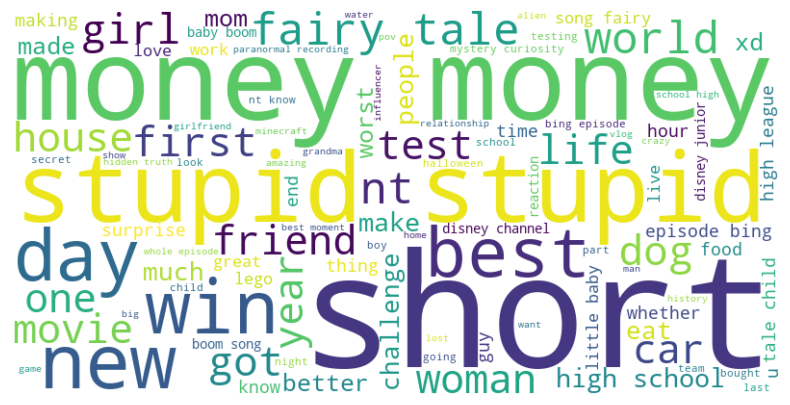

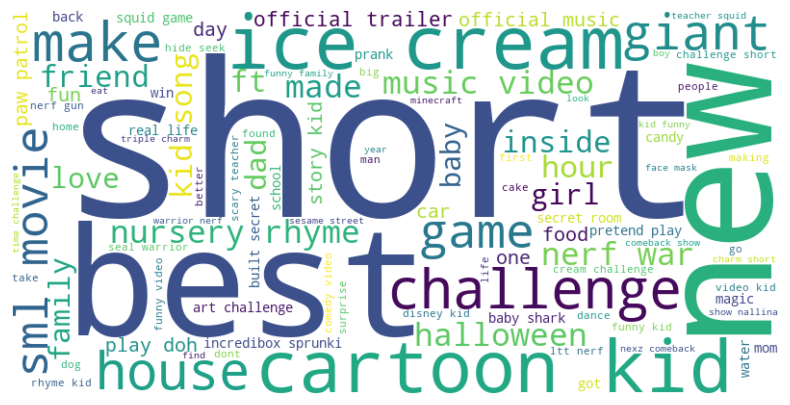

Batches:   0%|          | 0/647 [00:00<?, ?it/s]

Batches:   0%|          | 0/833 [00:00<?, ?it/s]

In [4]:
df_poland, df_us, features_pl, features_us = pipeline.get_normalized_features("Entertainment")

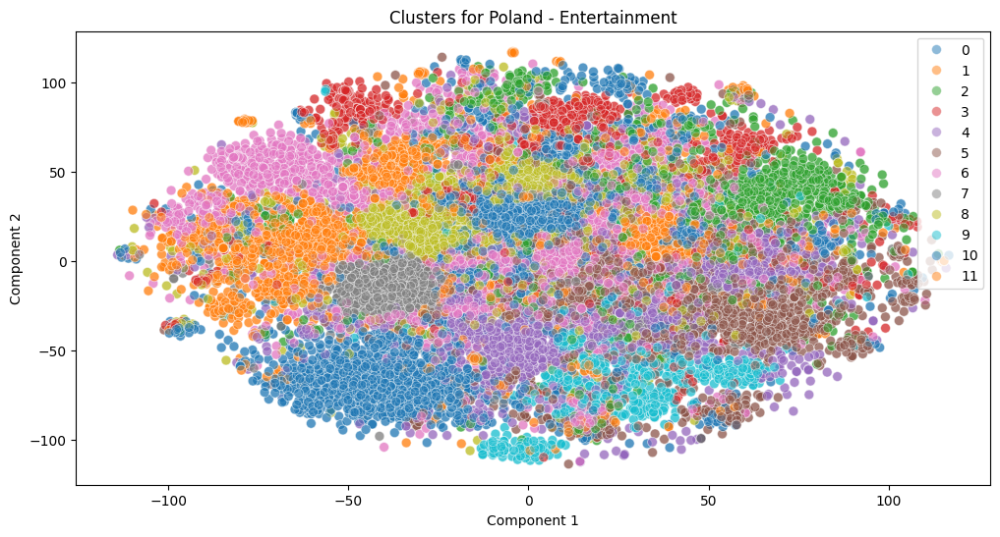

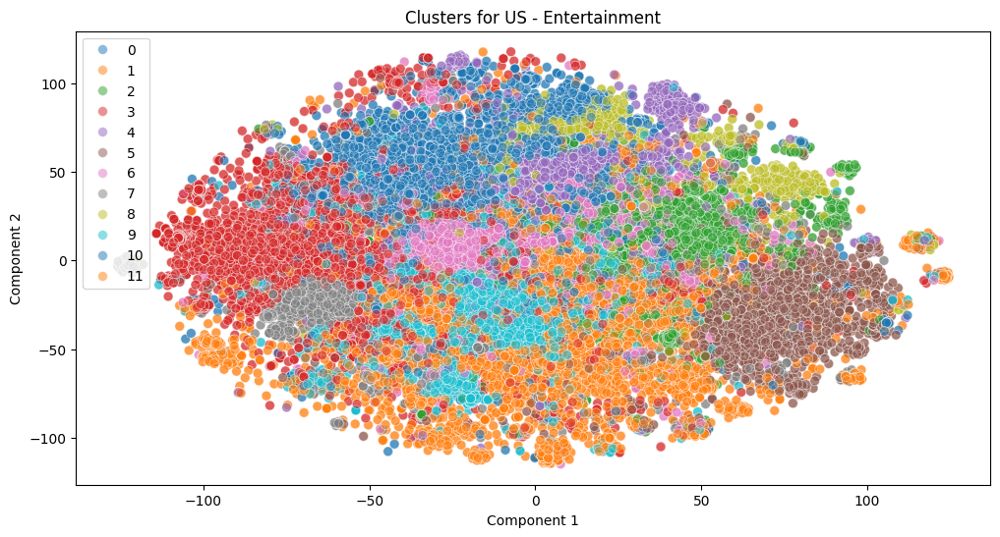

In [47]:
pipeline.analyze_similarity("Entertainment", "tsne", 12, features_pl, features_us, df_poland, df_us)

In [6]:
category = "Entertainment"
# reduce_method = "tsne"
num_clusters = 12
# tsne_params = {
#     "perplexity": 15,
#     "learning_rate": 0.5,
#     "max_iter": 5000,
#     "random_state": 42,
#     }

# reduced_features_poland = pipeline.reduce_dimensions(features_pl, method=reduce_method, **tsne_params)
# reduced_features_us = pipeline.reduce_dimensions(features_us, method=reduce_method, **tsne_params)

cluster_labels_poland = pipeline.get_clusters(features_pl, num_clusters)
cluster_labels_us = pipeline.get_clusters(features_us, num_clusters)

# pipeline.visualize_clusters_2d(reduced_features_poland, cluster_labels_poland, "Poland", category)
# pipeline.visualize_clusters_2d(reduced_features_us, cluster_labels_us, "US", category)

In [8]:
centroids_poland = pipeline.compute_cluster_centroids(features_pl, cluster_labels_poland)
centroids_us = pipeline.compute_cluster_centroids(features_us, cluster_labels_us)

similarity_matrix = pipeline.compute_similarity_between_clusters(centroids_poland, centroids_us)

common_words_poland = pipeline.get_most_common_words_for_clusters(df_poland, cluster_labels_poland)
common_words_us = pipeline.get_most_common_words_for_clusters(df_us, cluster_labels_us)

# pipeline.visualize_similarity(similarity_matrix, common_words_poland, common_words_us, category)
# pipeline.visualize_cluster_alignment(similarity_matrix, cluster_labels_poland, cluster_labels_us, df_poland, df_us, category, common_words_poland, common_words_us)

In [31]:
align_mapping = pipeline.align_clusters(similarity_matrix)
mapped_clusters_poland, mapped_clusters_us = pipeline.map_aligned_clusters(cluster_labels_poland, cluster_labels_us, align_mapping)
df_poland['original_cluster'] = cluster_labels_poland
df_us['original_cluster'] = cluster_labels_us
df_poland["top_topics"] = df_poland["original_cluster"].apply(lambda x: ", ".join(common_words_poland[x]))
df_us["top_topics"] = df_us["original_cluster"].apply(lambda x: ", ".join(common_words_us[x]))
df_poland['aligned_cluster'] = mapped_clusters_poland
df_us['aligned_cluster'] = mapped_clusters_us
combined_df = pd.concat([df_poland, df_us], axis=0)
combined_df = combined_df.sort_values(by="normalized_date")

In [35]:
combined_df["date"] = pd.to_datetime(combined_df["date"]).dt.date

In [ ]:
combined_df_agg_days = combined_df.groupby(["date", "aligned_cluster", "country"]).size().reset_index(name="count")

In [77]:
combined_df[combined_df["date"] == "2024-11-22"]

,video_id,title,description,category,thumbnail,author,author_id,views,likes,comments,date,country,normalized_date,cluster,original_cluster,top_topics,aligned_cluster


In [90]:
cluster_5 = combined_df_agg_days[combined_df_agg_days["aligned_cluster"] == 5]

In [95]:
cluster_5[cluster_5["country"] == "poland"]

,date,aligned_cluster,country,count
177,2016-07-04,5,poland,2
184,2016-08-25,5,poland,2
203,2016-11-09,5,poland,2
218,2017-01-22,5,poland,2
222,2017-02-22,5,poland,2
...,...,...,...,...
10993,2024-11-17,5,poland,6
11017,2024-11-18,5,poland,10
11041,2024-11-19,5,poland,4
11065,2024-11-20,5,poland,16


In [97]:
cluster_5[cluster_5["country"] == "united-states"]

,date,aligned_cluster,country,count
24,2013-04-15,5,united-states,2
292,2018-03-27,5,united-states,2
301,2018-04-13,5,united-states,2
315,2018-05-08,5,united-states,2
368,2018-10-06,5,united-states,2
...,...,...,...,...
11018,2024-11-18,5,united-states,24
11042,2024-11-19,5,united-states,42
11066,2024-11-20,5,united-states,46
11090,2024-11-21,5,united-states,34


In [79]:
combined_df["date"].min()

datetime.date(2011, 10, 31)

In [80]:
combined_df["date"].max()

datetime.date(2024, 11, 22)

In [82]:
for cluster in combined_df_agg_days["aligned_cluster"].unique():
    cluster_df = combined_df_agg_days[combined_df_agg_days["aligned_cluster"] == cluster]
    sorted_df = cluster_df.sort_values(by="date")
    fig = px.area(
        sorted_df,
        x="date",
        y="count",
        color="country",
        title=f"Cluster {cluster} Over Time",
        labels={"count": "Number of videos", "date": "Date", "country": "Country"}
    )
    fig.show()